In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
file = pd.ExcelFile('CVRP Data.xlsx')
Data = {}
for i,sheet in enumerate(file.sheet_names):
  if sheet == 'Info':
    Data['Info'] = pd.read_excel(file,sheet)
  else:
    Data[i] = pd.read_excel(file,sheet).drop('Index',axis=1)
    print(Data[i])

     X   Y  Demand
0   17  76       0
1   24   6      25
2   96  29       3
3   14  19      13
4   14  32      17
5    0  34      16
6   16  22       9
7   20  26      22
8   22  28      10
9   17  23      16
10  98  30       8
11  30   8       3
12  23  27      16
13  19  23      16
14  34   7      10
15  31   7      24
16   0  37      16
17  19  23      15
18   0  36      14
19  26   7       5
20  98  32      12
21   5  40       2
22  17  26      18
23  21  26      20
24  28   8      15
25   1  35       8
26  27  28      22
27  99  30      15
28  26  28      10
29  17  29      13
30  20  26      19
     X   Y  Demand
0   46  12       0
1   51   4      14
2   52  30      17
3   80  70      17
4   18  90      16
..  ..  ..     ...
73  82  53      15
74  21  85      21
75  64  41       4
76  80  50      23
77  16  10      19

[78 rows x 3 columns]
             X         Y  Demand
0      0.00000    0.0000       0
1     30.00000    0.0000      10
2     29.63060    4.6930      30
3     28.

In [ ]:
class GACVRP():
  def __init__(self, n:int, max_vehicle:int, capacity:int, maxgen:int, pc:float=0.95, pm:float=0.05, show_graph:bool=False):
    self.n = n
    self.max_vehicle = max_vehicle
    self.capacity = capacity
    self.maxgen = maxgen
    self.pc = pc
    self.pm = pm
    self.show_graph = show_graph

  def fit(self, data:pd.DataFrame):
    self.data = data
    self.dist = self.Euclidian()

  def Euclidian(self):
    data = self.data.copy()
    df_x = self.data['X']
    df_y= self.data['Y']
    dist_matrix = np.zeros((len(self.data), len(self.data)))

    for i in range(len(self.data)):
      for j in range(len(self.data)):
        dist_matrix[i,j] = np.sqrt((df_x[i] - df_x[j])**2 + (df_y[i]-df_y[j])**2)
    return pd.DataFrame(dist_matrix)


  def initialpop(self):
    pop = {}
    for i in range(self.n):
      pop[i] = np.random.permutation(len(self.data)-1)+1 #Exclude gen 0 from chromosome and include the last customer index to the chromosome
    return pop

  def crossover(self,pop): #Ordered Crossover (OX)
    offspring_pop = {}
    for i in range(self.n):
      r = np.random.rand(1) #random probability from 0 to 1
      if r<self.pc:
        select = np.random.permutation(list(pop.keys()))[:2] #take 2 chromosome index from pop as selected parents
        parent1 = pop[select[0]].copy()
        parent2 = pop[select[1]].copy()
        start_substring,stop_substring = np.random.permutation(range(len(parent1)))[:2]

        if start_substring>stop_substring:
          temp = start_substring
          start_substring = stop_substring
          stop_substring = temp
        substring = parent1[start_substring:stop_substring]

        parent1[np.isin(parent1,substring,invert=True)] = 0 #excludes gene values whose values are not from the selected substring
        parent2[np.isin(parent2,substring,invert=False)] = 0 #excludes gene values whose values are from the selected substring
        parent2 = parent2[parent2 != 0]
        parent1[parent1==0] = parent2 #add the remaining genes from parent2 to parent1
        offspring = parent1

        if r<self.pm:
          offspring = self.mutation(offspring)
        offspring_pop[i] = offspring
    return offspring_pop

  def mutation(self,offspring): #Scrambled mutation
    start_substring,stop_substring = np.random.permutation(range(len(offspring)))[:2]
    if start_substring>stop_substring:
      temp = start_substring
      start_substring = stop_substring
      stop_substring = temp
    offspring[start_substring:stop_substring] = np.random.permutation(offspring[start_substring:stop_substring])
    return offspring

  def elimpop(self, pop, offspring_pop, fitpop, fit_offspring, routes_pop, routes_offspring):
    combine = list(pop.values())+list(offspring_pop.values())
    combine_routes = list(routes_pop.values()) + list(routes_offspring.values())
    combine_fit = pd.concat([fitpop,fit_offspring]).reset_index(drop=True).sort_values(by='fitness',ascending=False).head(self.n)
    select = combine_fit.index
    combine_fit = combine_fit.reset_index(drop=True)
    pop = {i:combine[id] for i, id in enumerate(select)}
    routes = {i:combine_routes[id] for i, id in enumerate(select)}
    return pop, combine_fit, routes

  def fitness(self,pop_or_offspring):
    fitness_values = {}
    route_values = {}

    for i in pop_or_offspring.keys():
      route = {}
      chromosome = pop_or_offspring[i].copy()
      prevgen = chromosome[0]
      vehicle_load = self.capacity - self.data['Demand'].loc[prevgen]
      z = self.dist.loc[0,prevgen]
      z += self.dist.loc[chromosome[-1],0]

      id = 0
      route[id] = [0,prevgen]

      for j in range(len(chromosome)-1):
        prevgen = chromosome[j]
        nextgen = chromosome[j+1]
        if self.data['Demand'].loc[nextgen] > vehicle_load:
          z += self.dist.loc[prevgen,0]
          route[id] = route[id]+[0]

          vehicle_load = self.capacity - self.data['Demand'].loc[nextgen]
          id += 1
          z += self.dist.loc[0,nextgen]
          route[id] = [0,nextgen] #assign another vehicle to next customer

        else:
          vehicle_load -= self.data['Demand'].loc[nextgen]
          z += self.dist.loc[prevgen,nextgen]
          route[id] = route[id]+[nextgen] #assign current vehicle to next customer

        if id == self.max_vehicle: #if route vehicles exceeded max vehicle
          fitness_values[i] = 0
          break

      if id < self.max_vehicle:
        fitness_values[i] = 1/z
      route[id] = route[id]+[0] #last vehicle return to depot
      route_values[i] = route
    return pd.DataFrame.from_dict(fitness_values,columns=['fitness'],orient='index'),route_values

  def predict(self):
    pop = self.initialpop()
    fit,routes = self.fitness(pop)
    gen = 0
    while gen <= self.maxgen:
      gen+=1
      offspring = self.crossover(pop)
      fit_offspring, offspring_routes = self.fitness(offspring)
      pop, fit, routes = self.elimpop(pop, offspring, fit,fit_offspring, routes, offspring_routes)

      if self.show_graph:
        for key in routes[0].keys():
          graph = self.data.loc[routes[0][key]]
          plt.plot(graph['X'],graph['Y'],'o-', label='vehicle'+str(key+1))
        plt.plot(self.data['X'][0],self.data['Y'][0],marker='*',markersize=15,c='black',label='depot')
        plt.title('Fbest: '+str(fit['fitness'][0]))
        plt.legend(bbox_to_anchor=(1.05, 1.05))
        plt.show()

    return pop[0],routes[0], fit['fitness'][0]

#Solve CVRP

In [ ]:
import time

for i in range(6):
  print('\n\n======Data %d=========='%i)
  start_time = time.time()

  Solver = GACVRP(n=100,max_vehicle=Data['Info']['maxvehicles'][i],capacity=Data['Info']['capacity'][i],maxgen=10,pc=0.9,pm=0.05,show_graph=False)
  Solver.fit(Data[i])
  BestChromosome, BestRoutes, BestFitness =  Solver.predict()

  print('BestRoutes:\n',BestRoutes)
  print('Best Fitness:',BestFitness)
  print('Elapsed_time: ',time.time()-start_time)



======Data 0==========
BestRoutes:
 {0: [0, 4, 17, 6, 30, 5, 25, 0], 1: [0, 22, 29, 12, 9, 28, 23, 0], 2: [0, 1, 27, 2, 10, 20, 8, 13, 21, 0], 3: [0, 18, 11, 15, 19, 7, 16, 0], 4: [0, 26, 24, 14, 3, 0]}
Best Fitness: 0.001120186764411384
Elapsed_time:  1.6468327045440674


======Data 1==========
BestRoutes:
 {0: [0, 63, 45, 64, 74, 50, 10, 40, 0], 1: [0, 22, 33, 9, 7, 58, 31, 61, 39, 35, 23, 0], 2: [0, 18, 15, 34, 70, 12, 0], 3: [0, 42, 16, 62, 48, 53, 14, 0], 4: [0, 77, 60, 56, 1, 67, 26, 44, 66, 41, 0], 5: [0, 2, 4, 38, 3, 54, 65, 0], 6: [0, 76, 13, 28, 59, 29, 52, 0], 7: [0, 20, 6, 19, 68, 17, 5, 32, 73, 24, 0], 8: [0, 37, 75, 36, 69, 8, 49, 57, 25, 0], 9: [0, 27, 11, 30, 51, 72, 55, 21, 43, 46, 47, 71, 0]}
Best Fitness: 0.00027902567359394155
Elapsed_time:  3.7721903324127197


======Data 2==========
BestRoutes:
 {0: [0, 124, 153, 167, 163, 36, 81, 151, 231, 223, 16, 25, 117, 170, 206, 189, 18, 109, 98, 186, 143, 106, 160, 84, 95, 30, 100, 105, 0], 1: [0, 107, 78, 210, 56, 175, 1

#Solve CVRP with Graph for each Generations



======Data 0==========


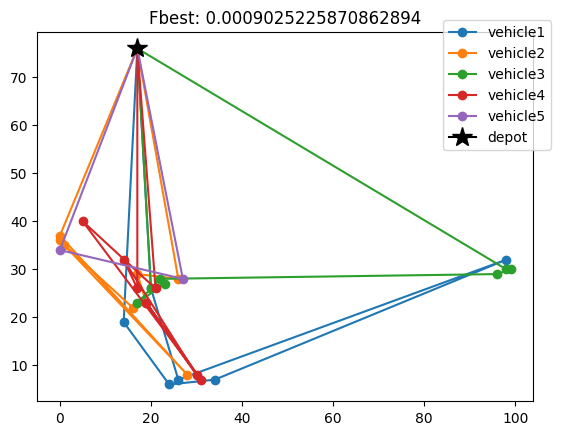

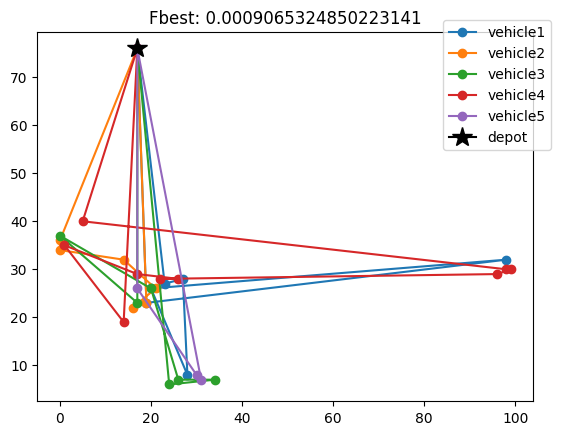

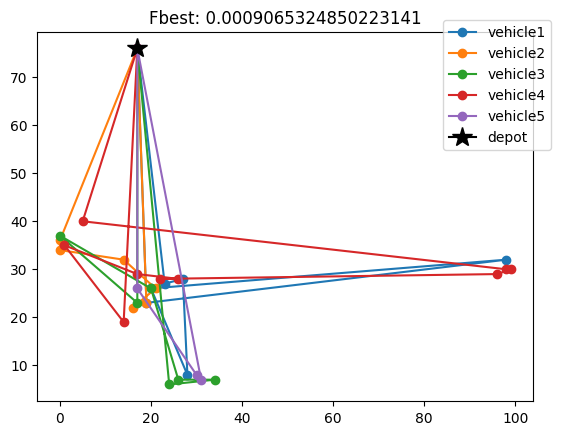

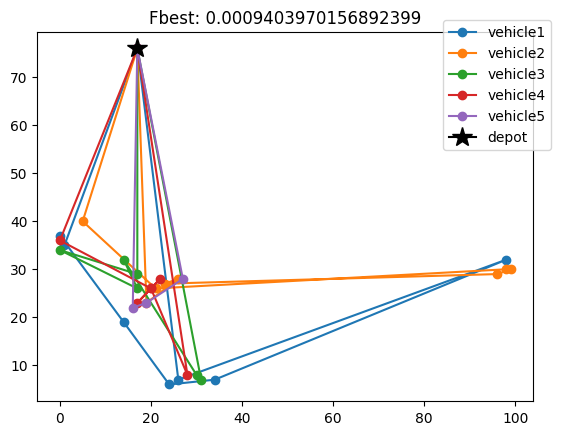

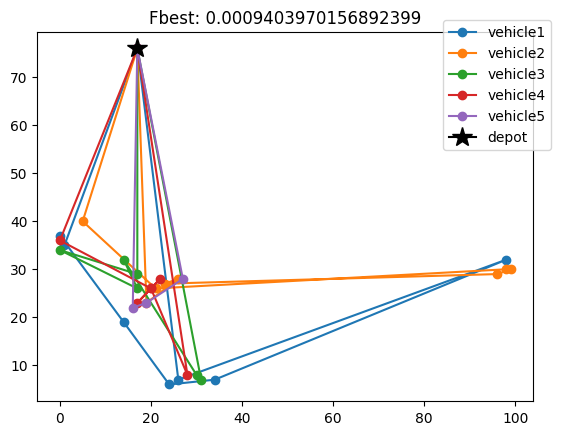

...

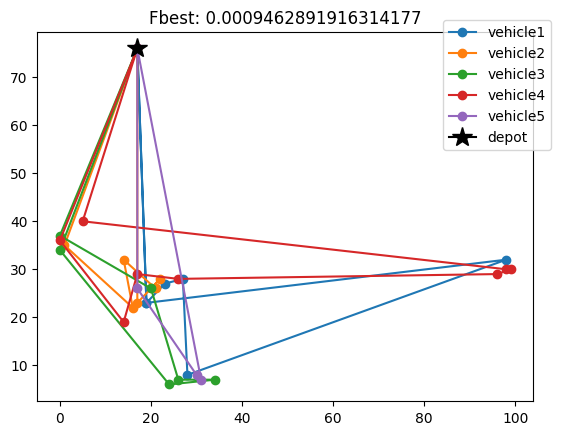

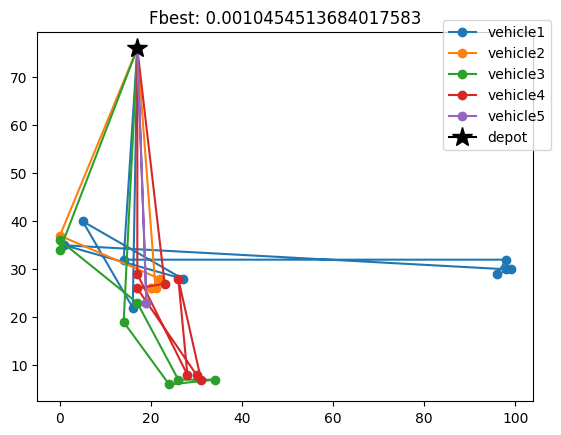

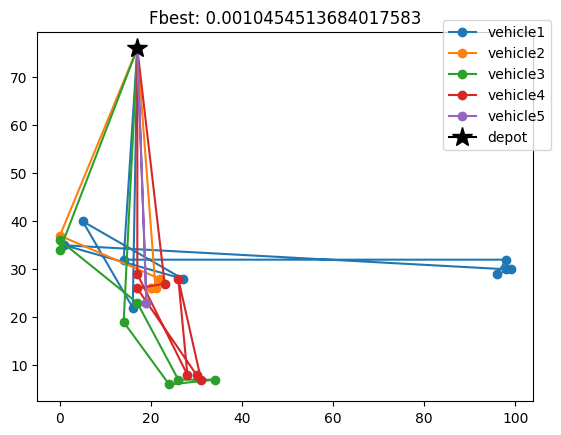

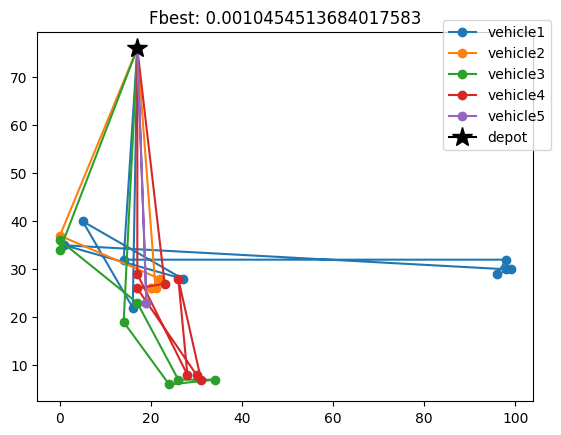

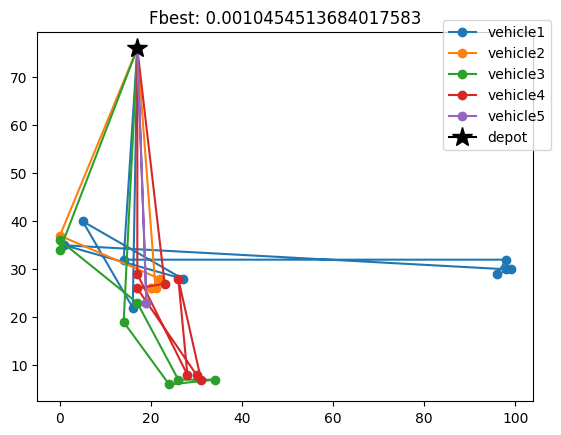

Elapsed_time:  6.7722320556640625


======Data 1==========


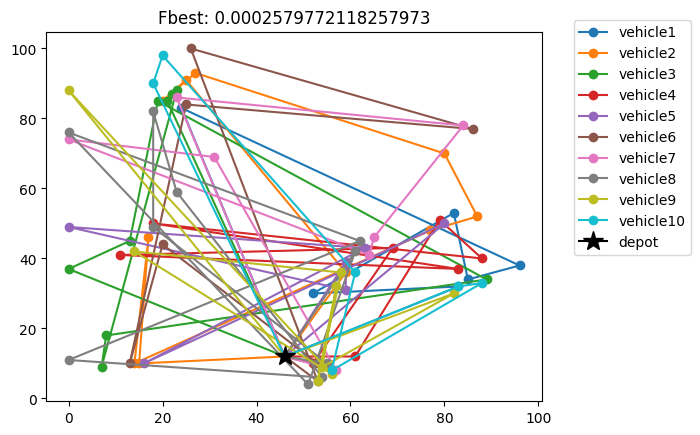

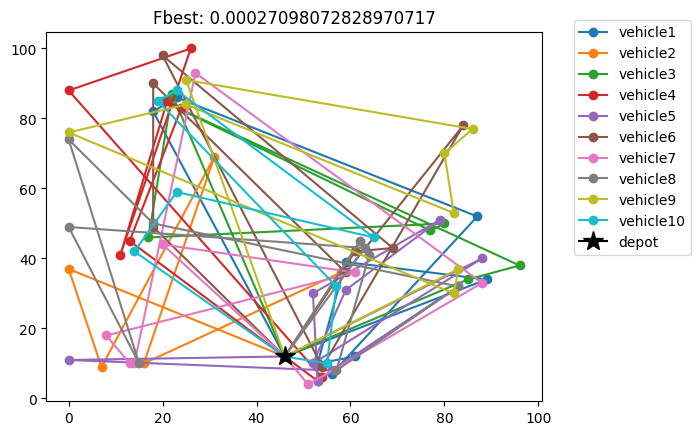

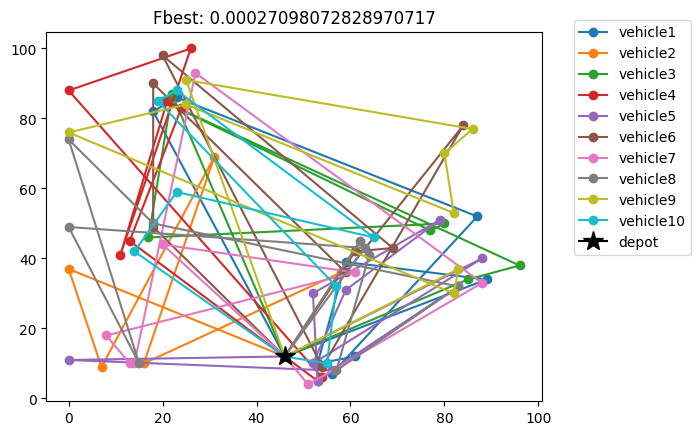

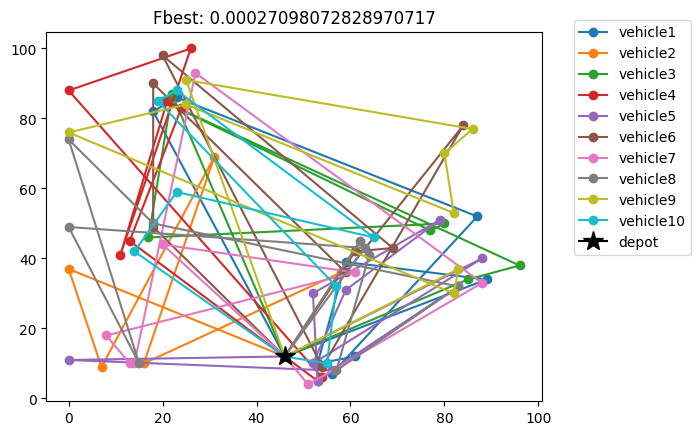

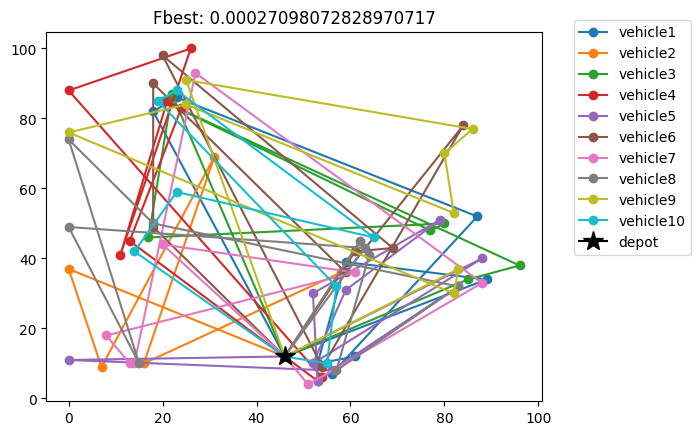

...

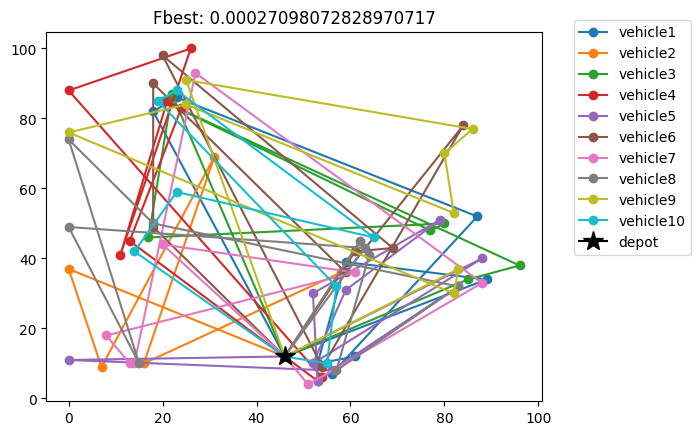

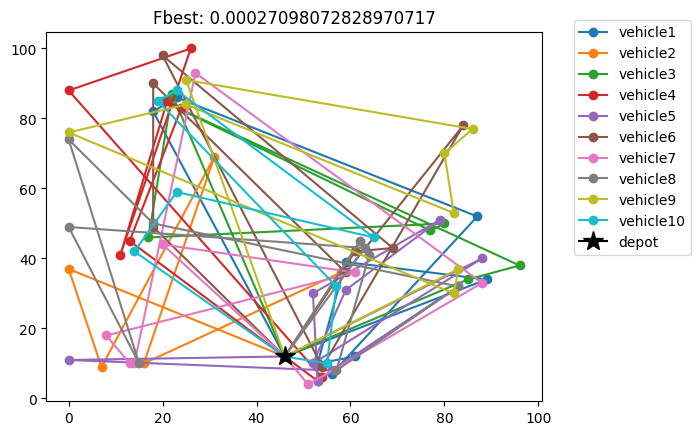

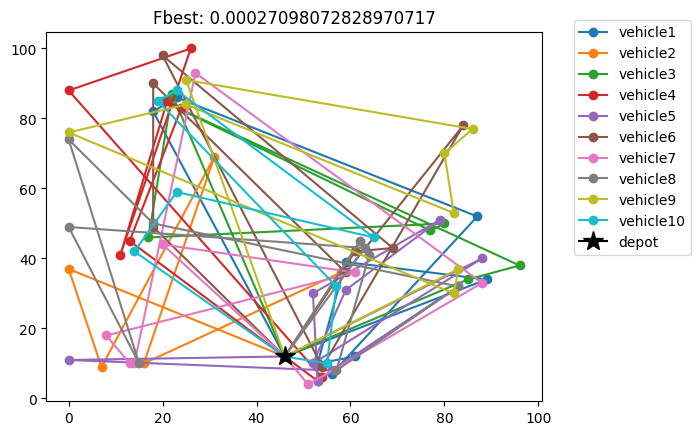

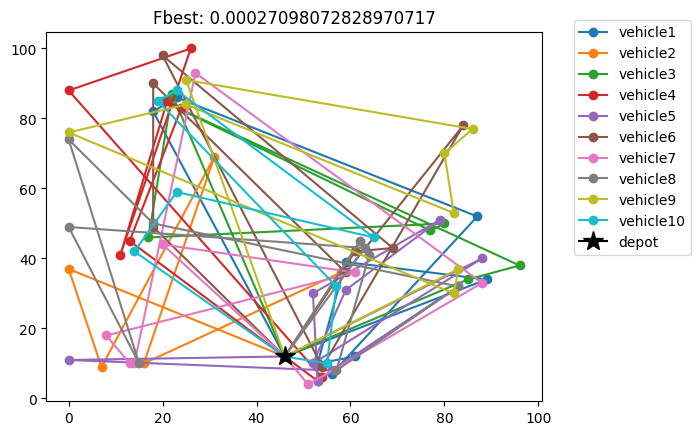

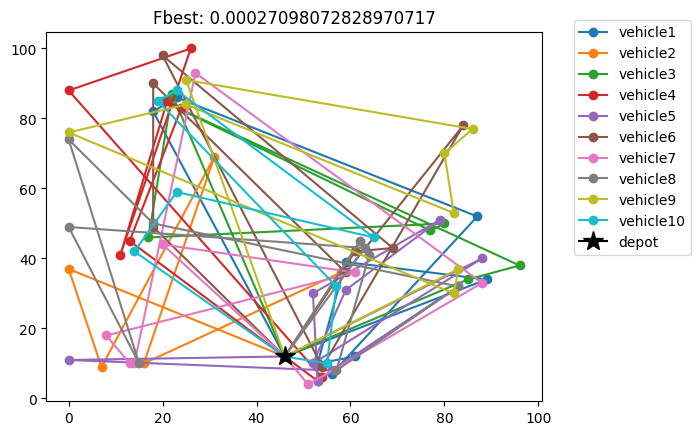

Elapsed_time:  9.824339866638184


======Data 2==========


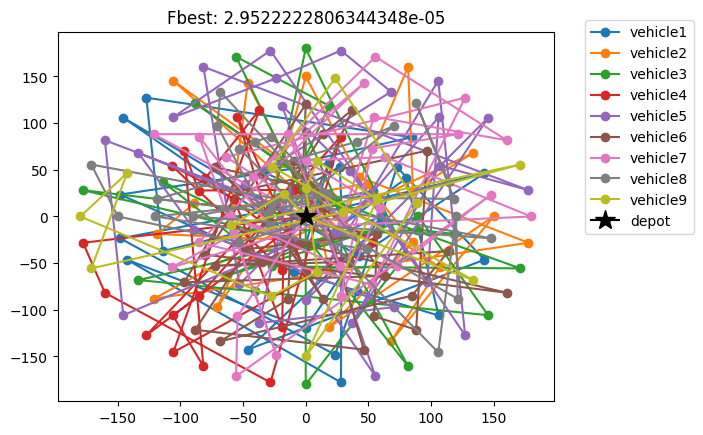

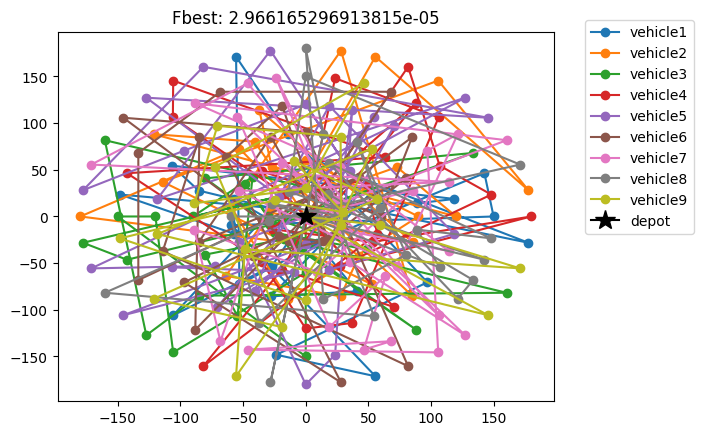

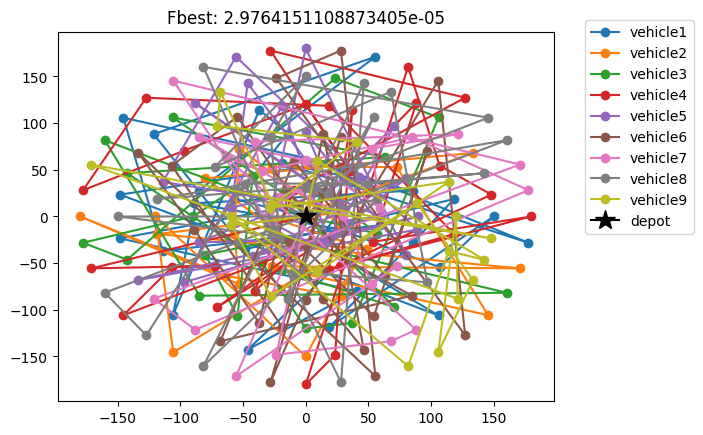

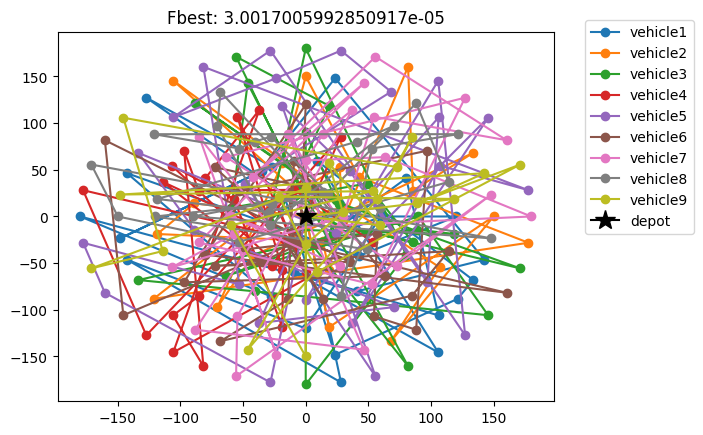

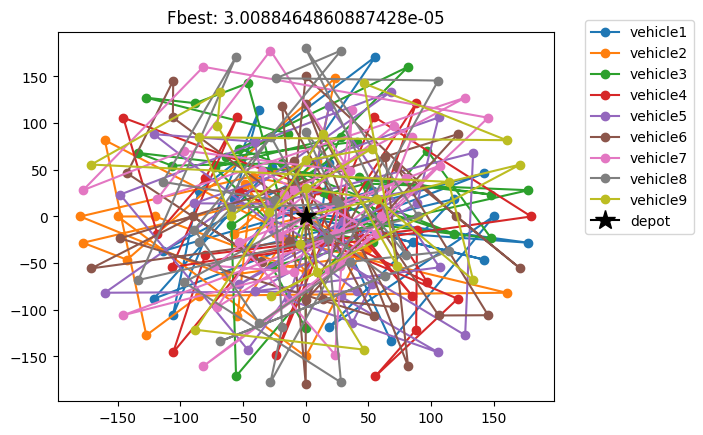

...

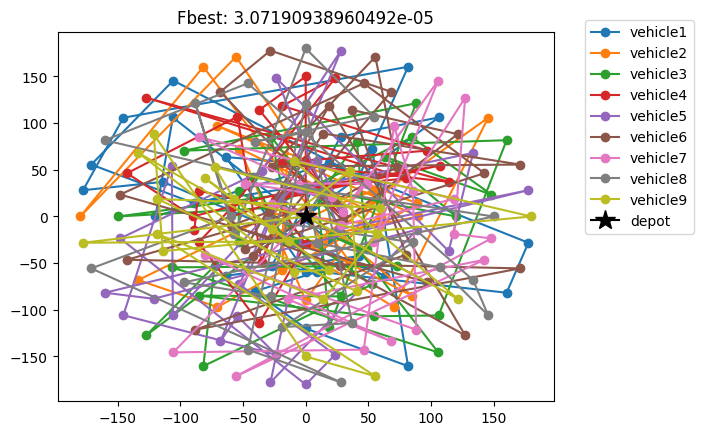

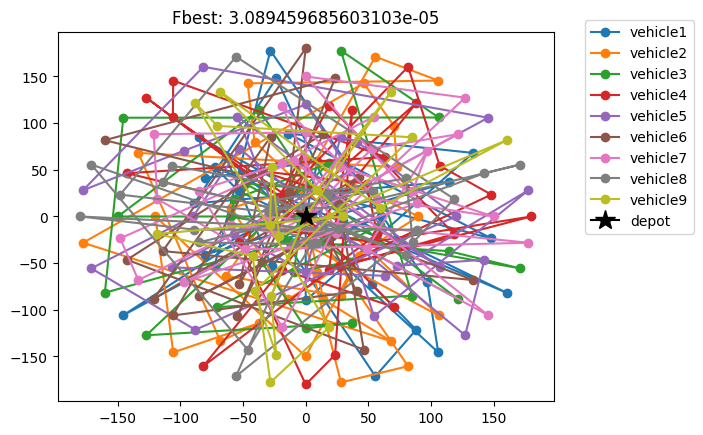

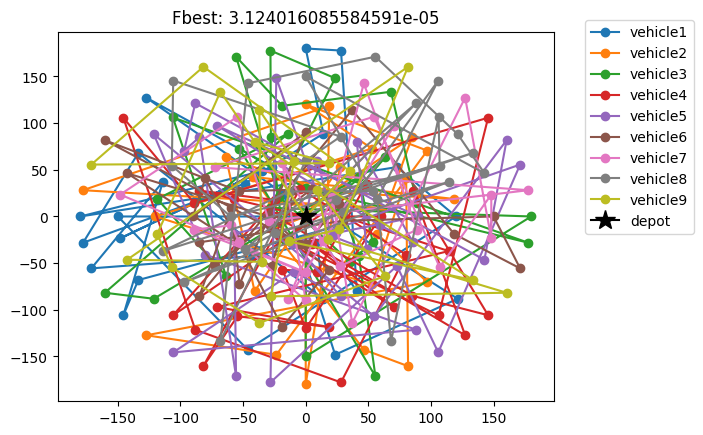

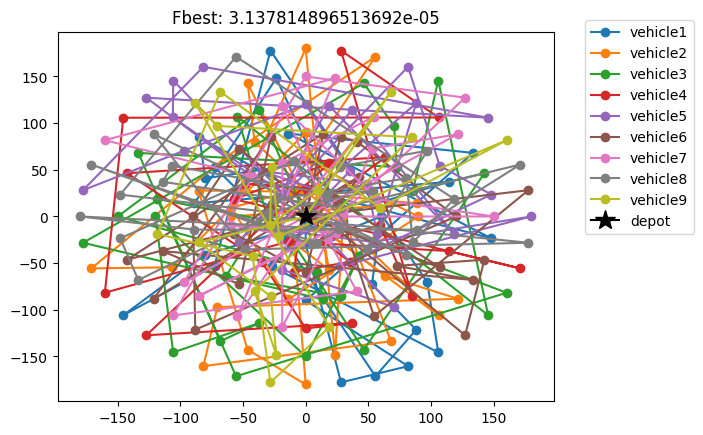

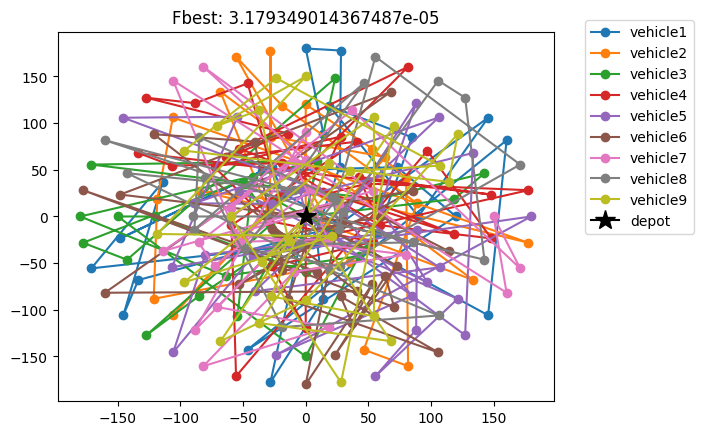

Elapsed_time:  20.661431312561035


======Data 3==========


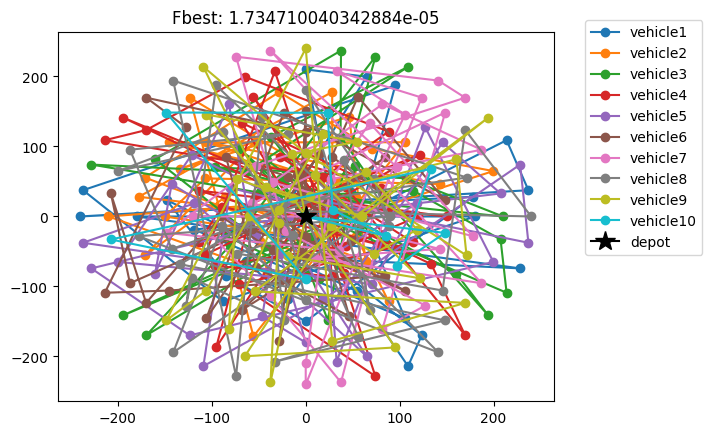

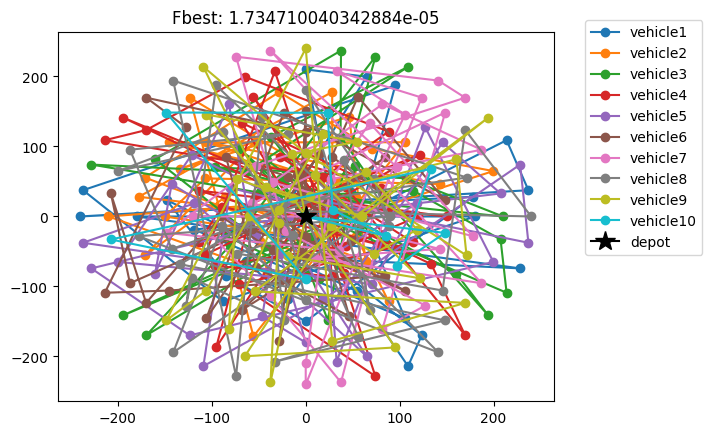

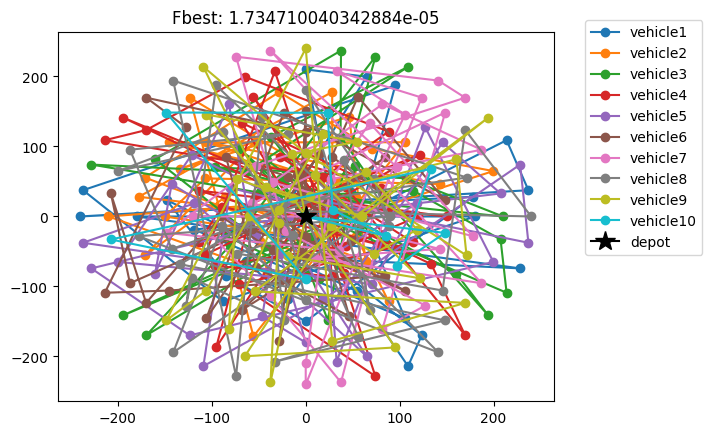

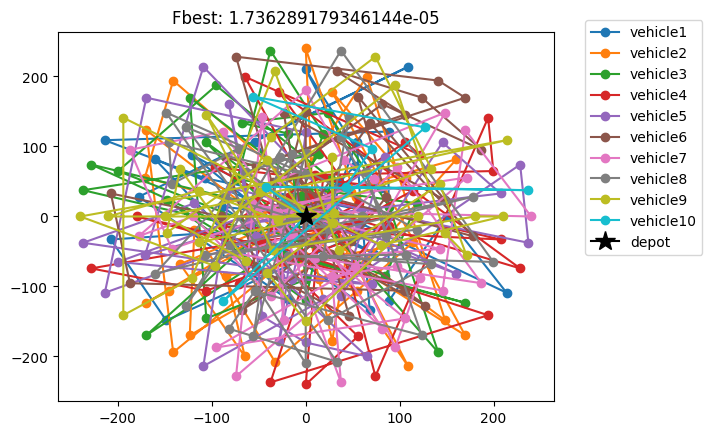

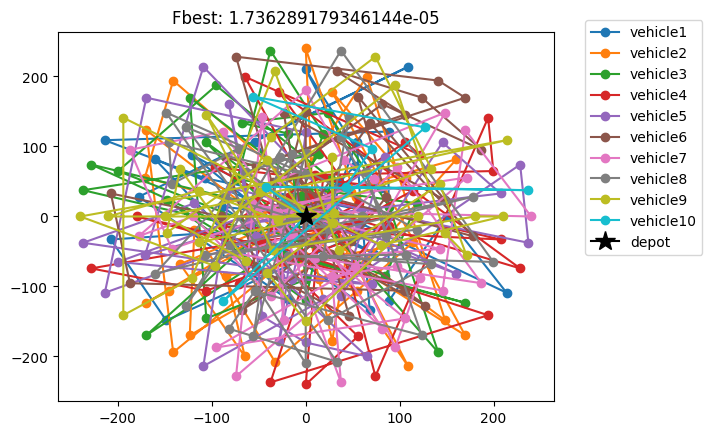

...

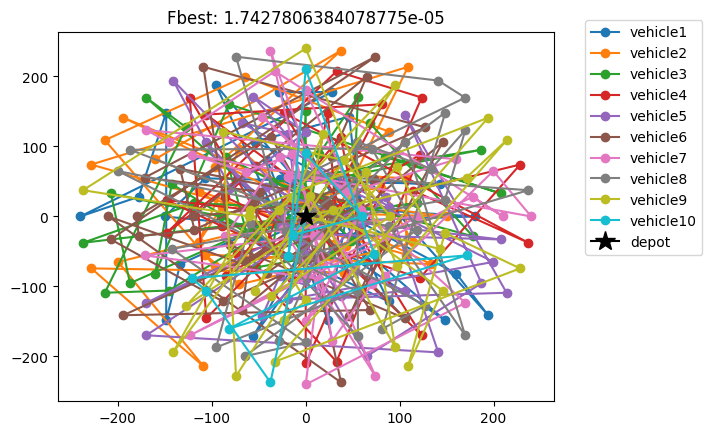

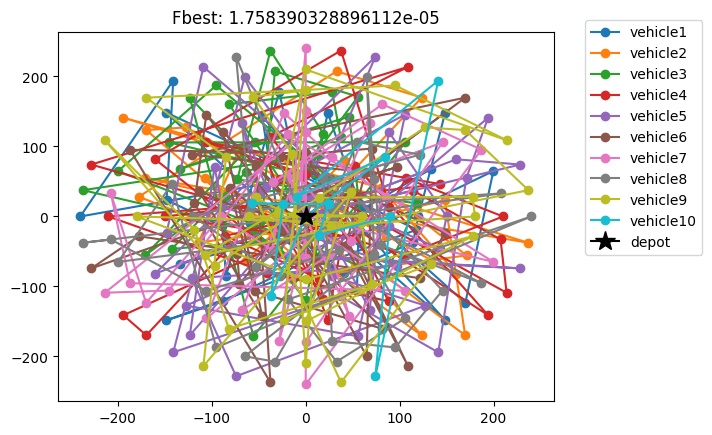

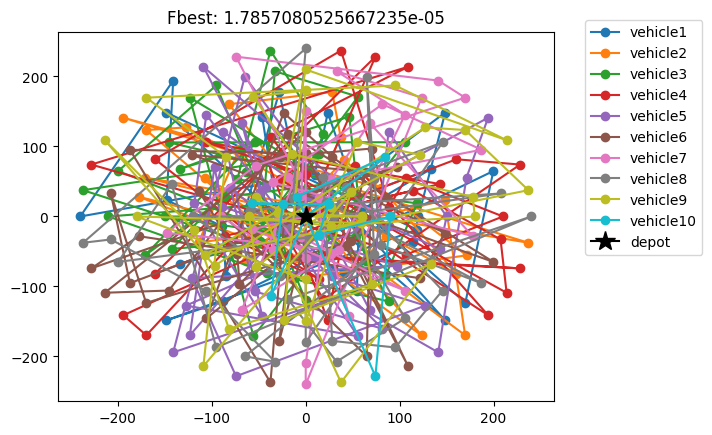

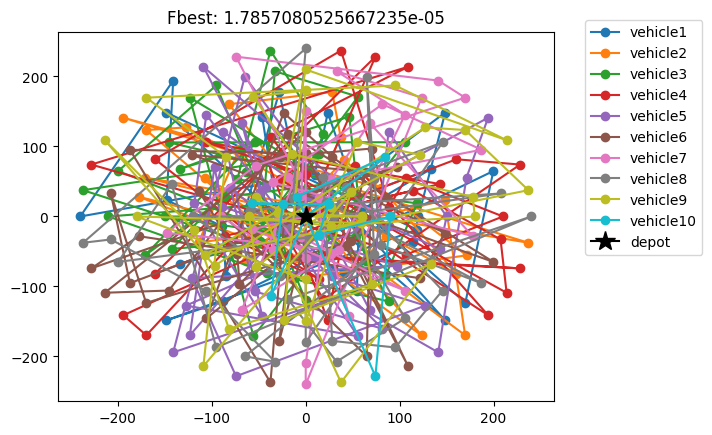

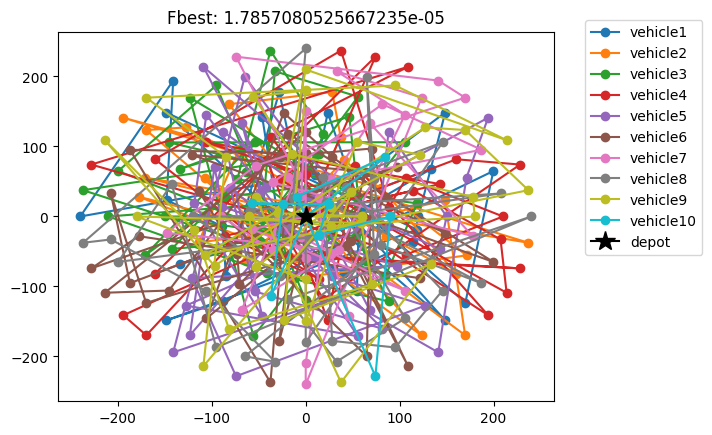

Elapsed_time:  25.196824550628662


======Data 4==========


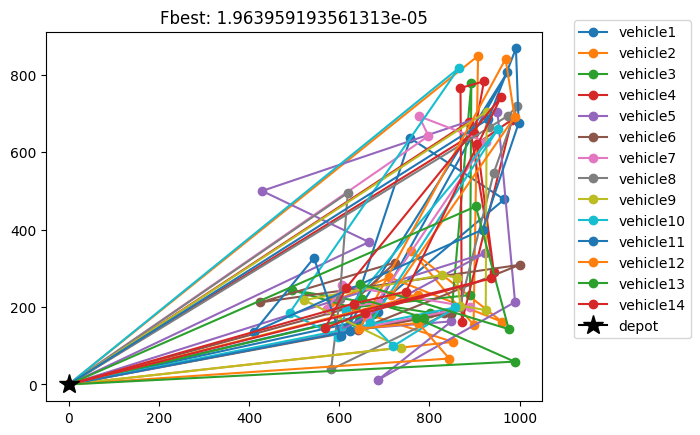

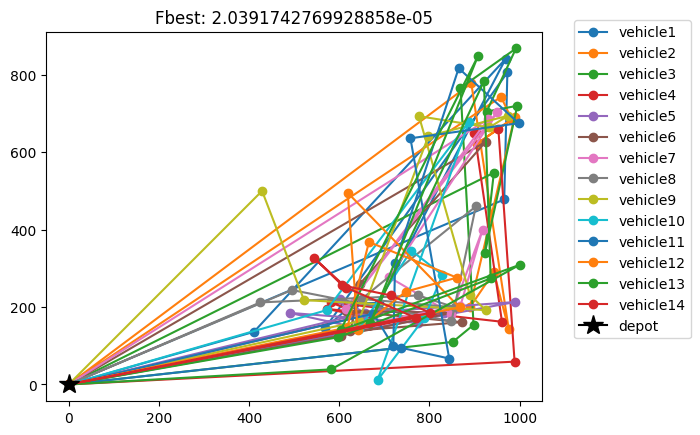

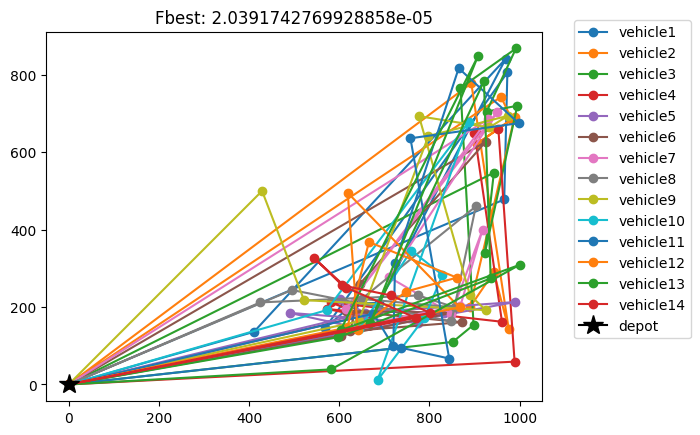

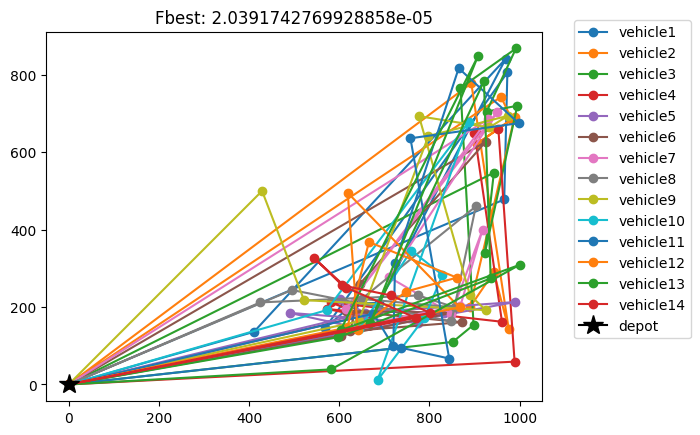

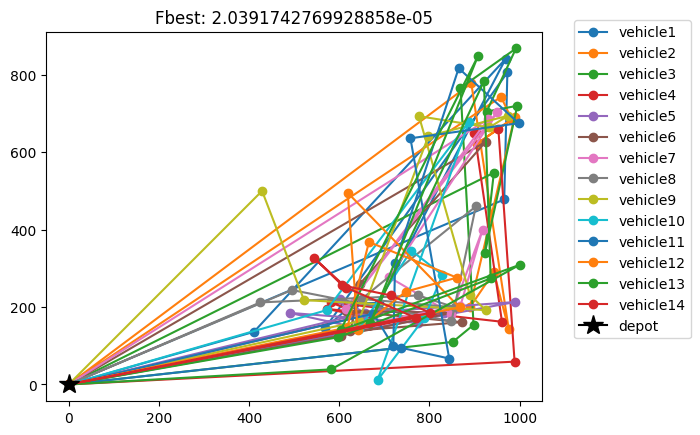

...

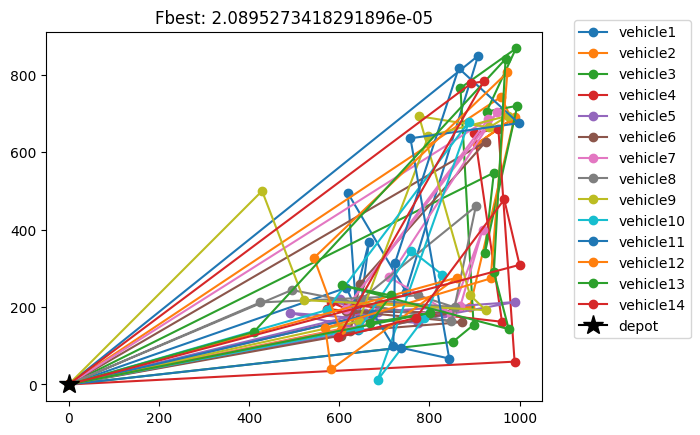

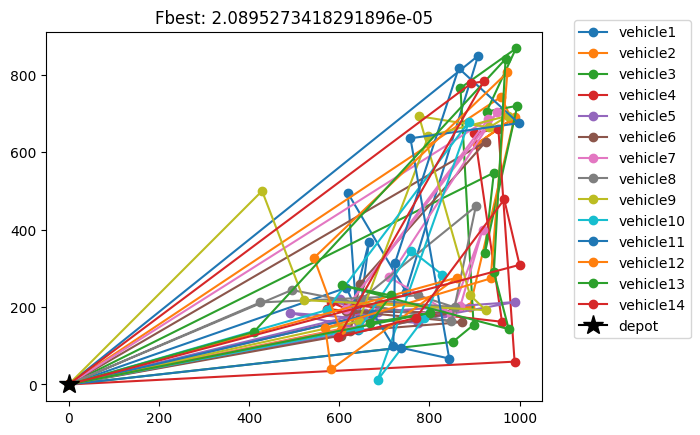

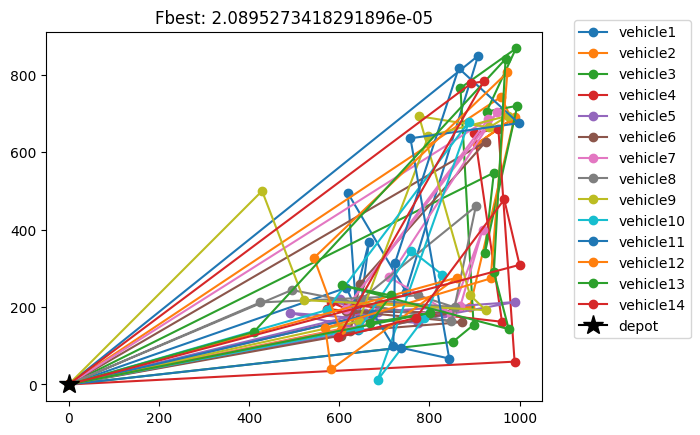

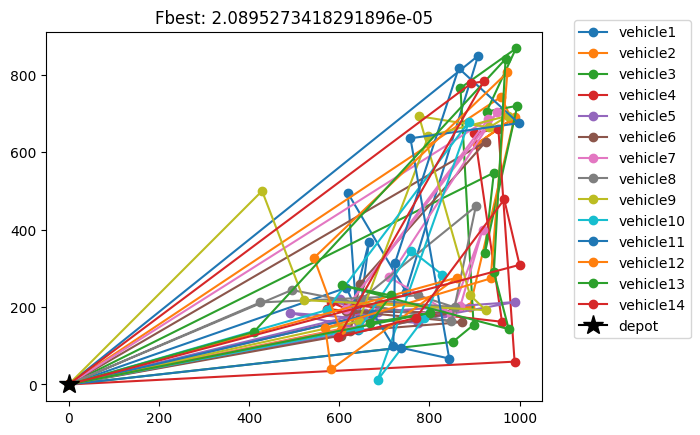

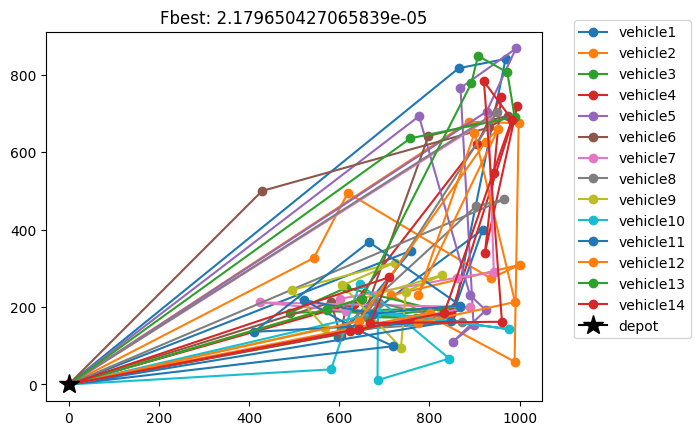

Elapsed_time:  12.300949335098267


======Data 5==========


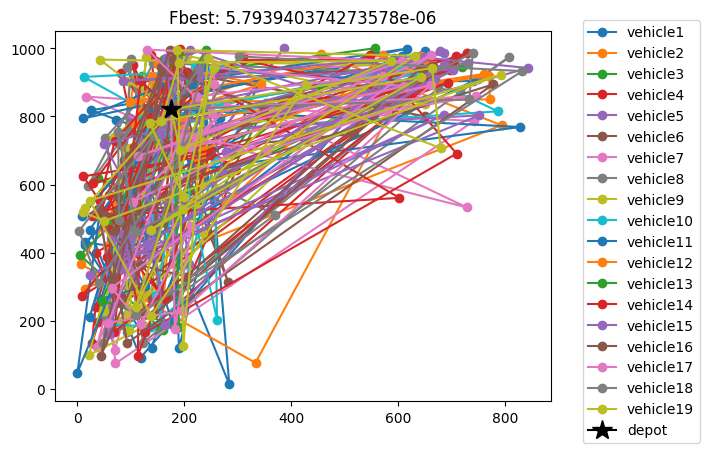

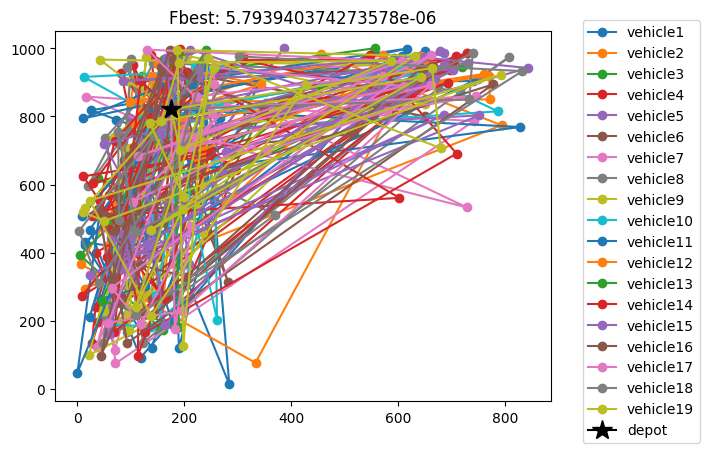

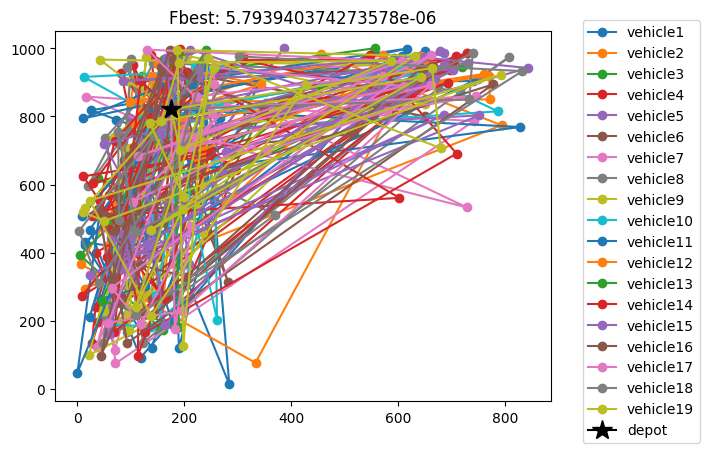

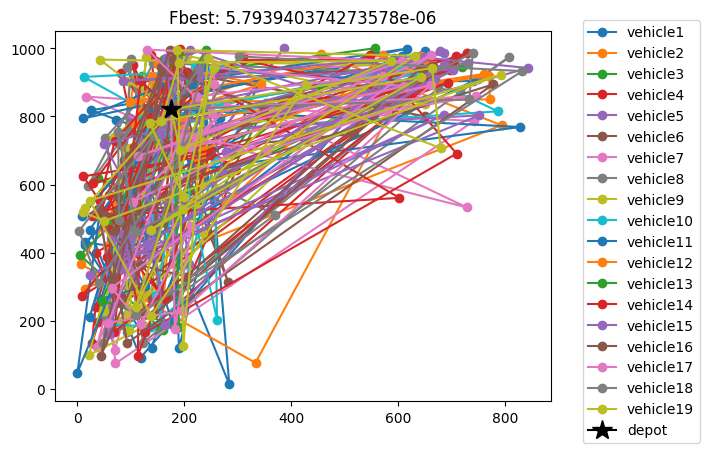

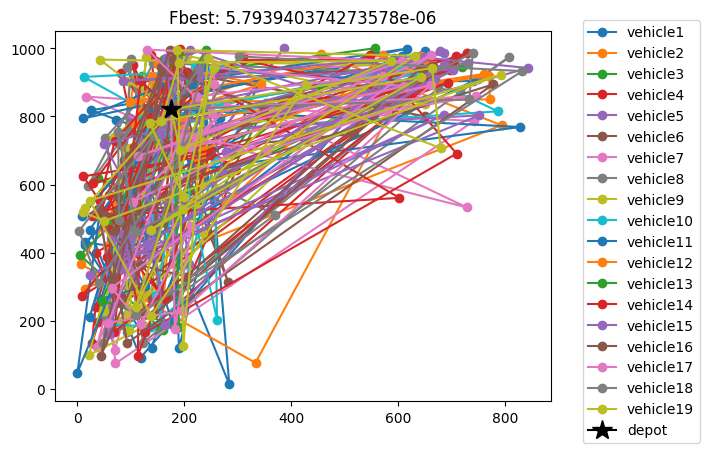

...

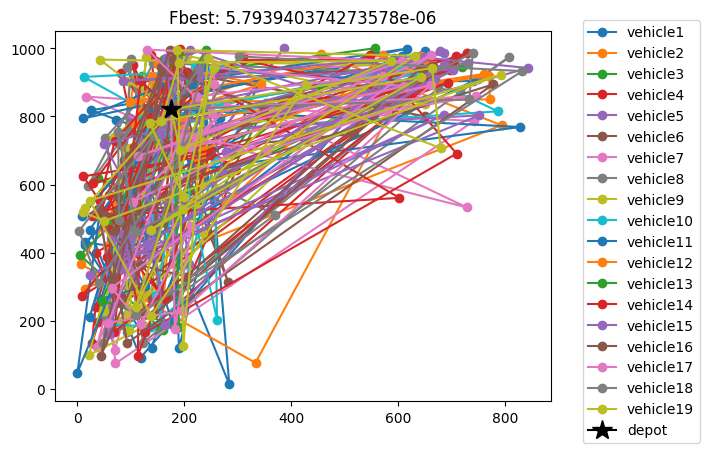

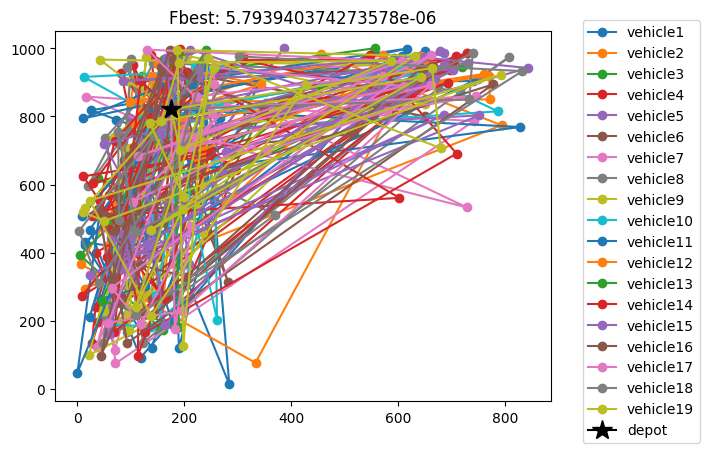

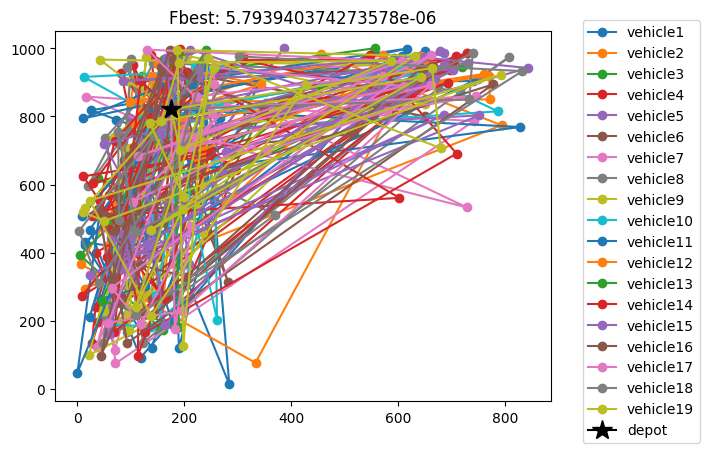

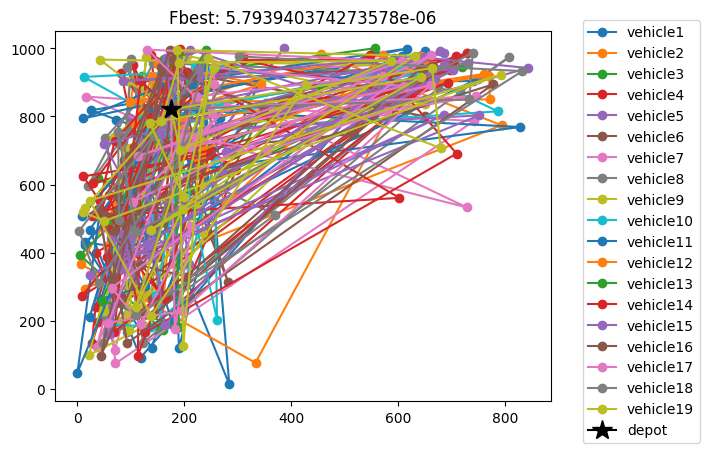

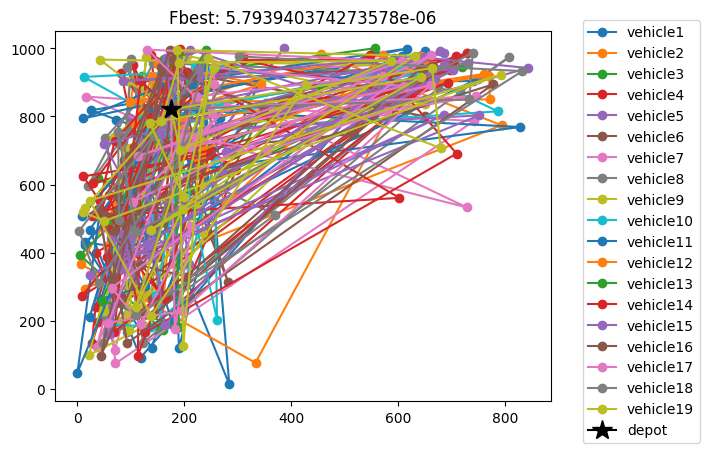

Elapsed_time:  33.139578104019165


In [ ]:
import time

for i in range(6):
  print('\n\n======Data %d=========='%i)
  start_time = time.time()

  Solver = GACVRP(n=100,max_vehicle=Data['Info']['maxvehicles'][i],capacity=Data['Info']['capacity'][i],maxgen=10,pc=0.9,pm=0.05,show_graph=True)
  Solver.fit(Data[i])
  BestChromosome, BestRoutes, BestFitness =  Solver.predict()

  print('Elapsed_time: ',time.time()-start_time)